In [1]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/ec2-user/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [8]:
#!pip install cufflinks
#!pip install gensim
#!pip install tqdm

In [97]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from nltk.corpus import stopwords
from nltk.util import ngrams
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from collections import defaultdict
from collections import  Counter
plt.style.use('ggplot')
stop=set(stopwords.words('english'))
import re
from nltk.tokenize import word_tokenize
import gensim
import string
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from tqdm import tqdm
from bs4 import BeautifulSoup 
import plotly.express as px
import cufflinks
import warnings 
warnings.filterwarnings('ignore')
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (10.0, 6.0)
import plotly.graph_objs as go
#import chart_studio.plotly as py
import cufflinks
pd.options.display.max_columns = 30
from IPython.core.interactiveshell import InteractiveShell
import plotly.figure_factory as ff
InteractiveShell.ast_node_interactivity = 'all'
from plotly.offline import iplot
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from collections import Counter
import matplotlib.patches as mpatches

In [101]:
data_path = 'interview_dataset.csv'
df = pd.read_csv(data_path)

In [102]:
ax = df['label'].value_counts().iplot(kind='bar',title="Number for each type of question(off topic/ on topic)")

### number of characters in a question

In [103]:
df['question_len'] = df['Body_processed'].str.len()
fig = px.histogram(df, x="question_len", color="label")
fig.show()

### number of words in a question

In [104]:
df['num_words'] = df['Body_processed'].str.split().map(lambda x: len(x))

In [105]:
fig = px.histogram(df, x="num_words", color="label")
fig.show()

In [106]:
def extract_code_blocks(html):
    if not html or html == '':
        return 0,0,[]
    
    soup = BeautifulSoup(html,'html.parser')
    res = list()
    for a in soup.find_all('pre'):
        if a.string:
            res.append(a.string)

    return len(res), sum([len(s) for s in res]), res

In [109]:
df['nums_code_block'],df['len_code_block'],df['code_blocks'] = zip(*df['Body'].apply(lambda x: extract_code_blocks(x)))

In [110]:
fig = px.histogram(df, x="nums_code_block", color="label")
fig.show()

In [111]:
fig = px.histogram(df, x="len_code_block", color="label")

fig.show()

In [112]:
def url_count(text):
    # stack over flow url counts
    so_url=0
    urls = re.findall(r'(https?://\S+)',text )
    if urls:
        so_url = sum(['stackoverflow.com' in url for url in urls])
    return len(urls), so_url
    

In [113]:
df['num_url'], df['num_so_url'] = zip(*df['Body'].apply(lambda x: url_count(x)))

In [114]:
fig = px.histogram(df, x="num_url", color="label")

fig.show()

In [115]:
fig = px.histogram(df, x="num_so_url", color="label")

fig.show()

### From our analysis till now we can infer the following:

1. Length of title and questions are useful features. Longer questions/title tend to be on-topic questions.
2. Number of code block, length of code block are useful features. Questions that have code blocks and longer code blocks tend to be 
3. Number of URL's and number of stackoverflow urls might be slightly usefull.
    

### We will now analyze text features, but first we clean

In [116]:
import nltk.tokenize as tokenizer
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
from bs4 import BeautifulSoup
stemmer = SnowballStemmer('english')
stop_words = set(stopwords.words('english'))

def remove_html(text):
    """
    :return: self
    """

    # Remove html
    #return BeautifulSoup(text, "lxml").text
    return re.sub(r"\<[^\>]\>", "", text).lower()

def remove_stopwords(text):
    """
    :return: self
    """
    tokens = tokenizer.SpaceTokenizer().tokenize(text)
    filtered = [w for w in tokens if not w in stop_words]
    return ' '.join(map(str, filtered))

def remove_punc(text):
    """
    :return: self
    """
    tokens = tokenizer.SpaceTokenizer().tokenize(text)
    # remove punctuations from each token
    tokens = list(map(lambda token: re.sub(r"[^A-Za-z0-9]+", " ", token).strip(), tokens))
    # remove empty strings from tokens
    tokens = list(filter(lambda token: token, tokens))
    return ' '.join(map(str, tokens))

def stem_text(text):
    """
    :return: self
    """
    tokens = tokenizer.SpaceTokenizer().tokenize(text)
    # stem each token
    tokens = list(map(lambda token: stemmer.stem(token), tokens))
    return ' '.join(map(str, tokens))

def remove_code_block(text):
    return re.sub('<pre><code>((.|\n)*?)</code></pre>', '',text)

In [117]:
df['Title'].fillna('',inplace=True)
df['Body'].fillna('',inplace=True)

In [118]:
# apply preprocessing to title 
df['title_clean'] = df['Title'].apply(lambda x: remove_stopwords(x))
df['title_clean'] = df['title_clean'].apply(lambda x: remove_punc(x))
df['title_clean'] = df['title_clean'].apply(lambda x: stem_text(x))

In [119]:
# apply preprocessing to body
df['body_clean'] = df['Body'].apply(lambda x: remove_html(x))
df['body_clean'] = df['body_clean'].apply(lambda x: remove_stopwords(x))
df['body_clean'] = df['body_clean'].apply(lambda x: remove_punc(x))
df['body_clean'] = df['body_clean'].apply(lambda x: stem_text(x))

### plotting term frequency for off topic questions

### plotting term frequency for on topic questions

In [120]:
#create corpus
def create_corpus(target):
    corpus=[]
    
    for x in df[df['label']==target]['body_clean'].str.split():
        for i in x:
            corpus.append(i)
    return corpus

In [121]:
off_topic_body_corpus = create_corpus(0)
on_topic_body_corpus = create_corpus(1)

In [122]:
counter=Counter(off_topic_body_corpus)
most=counter.most_common()
x=[]
y=[]
for word,count in most[5:100]:
    if (word not in stop) :
        x.append(word)
        y.append(count)
#sns.barplot(x=y,y=x)

In [123]:
fig = px.bar(df, y=y, x=x)
#fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
#fig.show()

In [124]:
counter=Counter(on_topic_body_corpus)
most=counter.most_common()
x=[]
y=[]
for word,count in most[5:100]:
    if (word not in stop) :
        x.append(word)
        y.append(count)
fig = px.bar(df, y=y, x=x)
#fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')


In [125]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english', min_df = 10).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]


In [126]:
common_words = get_top_n_words(df[df['label']==1]['body_clean'], 100)
# for word, freq in common_words:
#     print(word, freq)
df1 = pd.DataFrame(common_words, columns = ['text' , 'count'])
df1.groupby('text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 100 bi grams in off topic questions')


In [127]:
common_words = get_top_n_words(df[df['label']==0]['body_clean'], 100)

df1 = pd.DataFrame(common_words, columns = ['text' , 'count'])
df1.groupby('text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 100 words in on topic questions')

In [128]:
common_words = get_top_n_words(df[df['label']==0]['title_clean'], 100)

df1 = pd.DataFrame(common_words, columns = ['text' , 'count'])
df1.groupby('text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 100 words in on topic titles')

In [129]:
common_words = get_top_n_words(df[df['label']==1]['title_clean'], 100)

df1 = pd.DataFrame(common_words, columns = ['text' , 'count'])
df1.groupby('text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 100 words in off topic titles')

In [130]:
def get_first_word(text):
    return text.split()[0].lower()

In [131]:
def get_first_word_body(text):
    text = BeautifulSoup(text).text
    return text.split()[0].lower()

In [132]:
df['first_word_title'] = df['Title'].apply(lambda x: get_first_word(x))

In [133]:
off_topic_body = pd.DataFrame(df[df['label']==1].groupby(['first_word_title']).count()['Title']).reset_index()

In [134]:
on_topic_body = pd.DataFrame(df[df['label']==0].groupby(['first_word_title']).count()['Title']).reset_index()

In [135]:
off_topic_body.groupby('first_word_title').sum()['Title'].sort_values(ascending=False)[:25].iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 100 first words in off topic titles')

In [136]:
on_topic_body.groupby('first_word_title').sum()['Title'].sort_values(ascending=False)[:25].iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 100 first words in on topic titles')

### Text based features

1. There seems to be some values in the bigrams and tri grams to distinguish between the two categories.
2. It seems like the starting word can be a decent feature as wel


### Plotting different text embeddings
1. Use LSA to reduce the embeddings to 2D
2. Plot and see if we can distinguish the two classes

In [141]:
def plot_lsa(test_data, test_labels, plot=True):
        lsa = TruncatedSVD(n_components=2)
        lsa.fit(test_data)
        lsa_scores = lsa.transform(test_data)
        color_mapper = {label:idx for idx,label in enumerate(set(test_labels))}
        color_column = [color_mapper[label] for label in test_labels]
        colors = ['orange','blue']
        if plot:
            plt.scatter(lsa_scores[:,0], lsa_scores[:,1], s=8, alpha=.8, c=test_labels, cmap=matplotlib.colors.ListedColormap(colors))
            orange_patch = mpatches.Patch(color='orange', label='Not')
            blue_patch = mpatches.Patch(color='blue', label='Real')
            plt.legend(handles=[orange_patch, blue_patch], prop={'size': 30})

In [138]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report

def get_metrics(y_test, y_predicted):  
    # true positives / (true positives+false positives)
    precision = precision_score(y_test, y_predicted, pos_label=None,
                                    average='weighted')             
    # true positives / (true positives + false negatives)
    recall = recall_score(y_test, y_predicted, pos_label=None,
                              average='weighted')
    
    # harmonic mean of precision and recall
    f1 = f1_score(y_test, y_predicted, pos_label=None, average='weighted')
    
    # true positives + true negatives/ total
    accuracy = accuracy_score(y_test, y_predicted)
    return accuracy, precision, recall, f1

In [145]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split

def cv(data):
    count_vectorizer = CountVectorizer(min_df = 10)

    emb = count_vectorizer.fit_transform(data)

    return emb, count_vectorizer

list_corpus = df["body_clean"].tolist()
list_labels = df["label"].tolist()


X_train, X_test, y_train, y_test = train_test_split(list_corpus, list_labels, test_size=0.2, 
                                                                                random_state=40)

X_train_counts, count_vectorizer = cv(X_train)
X_test_counts = count_vectorizer.transform(X_test)

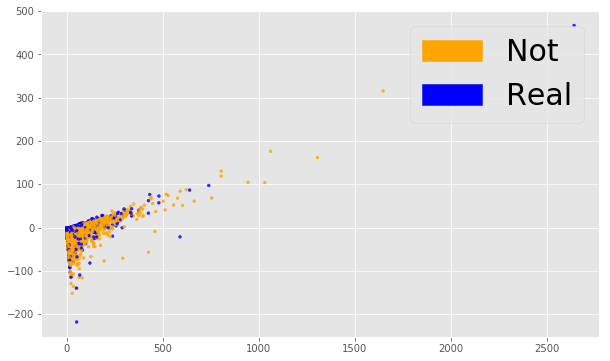

In [144]:
plot_lsa(X_train_counts, y_train)
plt.show()

In [146]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression(C=30.0, n_jobs=-1, random_state=40)
clf.fit(X_train_counts, y_train)

y_predicted_counts = clf.predict(X_test_counts)

LogisticRegression(C=30.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=-1, penalty='l2', random_state=40,
                   solver='lbfgs', tol=0.0001, verbose=0, warm_start=False)

In [147]:

accuracy, precision, recall, f1 = get_metrics(y_test, y_predicted_counts)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy, precision, recall, f1))


accuracy = 0.781, precision = 0.783, recall = 0.781, f1 = 0.781


In [148]:
def tfidf(data):
    tfidf_vectorizer = TfidfVectorizer(ngram_range=(1, 3), min_df = 10)

    train = tfidf_vectorizer.fit_transform(data)

    return train, tfidf_vectorizer

list_corpus = df["body_clean"].tolist()
list_labels = df["label"].tolist()
X_train_tfidf, tfidf_vectorizer = tfidf(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)


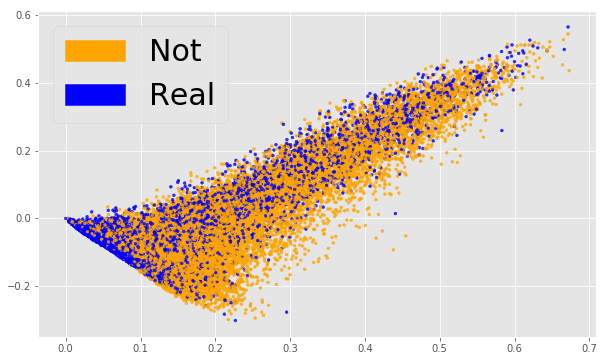

In [150]:
plot_lsa(X_train_tfidf, y_train)
plt.show()

In [151]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression(C=30.0, n_jobs=-1, random_state=40)
clf.fit(X_train_tfidf, y_train)

y_predicted_tfidf = clf.predict(X_test_tfidf)

LogisticRegression(C=30.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=-1, penalty='l2', random_state=40,
                   solver='lbfgs', tol=0.0001, verbose=0, warm_start=False)

In [152]:
accuracy, precision, recall, f1 = get_metrics(y_test, y_predicted_tfidf)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy, precision, recall, f1))


accuracy = 0.788, precision = 0.788, recall = 0.788, f1 = 0.788


### Trying out contextual embeddings

In [ ]:
import gensim

word2vec_path = "GoogleNews-vectors-negative300.bin.gz"
word2vec = gensim.models.KeyedVectors.load_word2vec_format(word2vec_path, binary=True)

In [155]:
#tokenizer = RegexpTokenizer(r'\w+')
#df["tokens"] = df[""].apply(lambda x: remove_html(x))
from nltk.tokenize import RegexpTokenizer

retokenizer = RegexpTokenizer(r'\w+')
#df['tokens'] = df['Body'].apply(lambda x: remove_html(x))
df["tokens"] = df["body_clean"].apply(retokenizer.tokenize)

In [153]:
def get_average_word2vec(tokens_list, vector, generate_missing=False, k=300):
    if len(tokens_list)<1:
        return np.zeros(k)
    if generate_missing:
        vectorized = [vector[word] if word in vector else np.random.rand(k) for word in tokens_list]
    else:
        vectorized = [vector[word] if word in vector else np.zeros(k) for word in tokens_list]
    length = len(vectorized)
    summed = np.sum(vectorized, axis=0)
    averaged = np.divide(summed, length)
    return averaged

def get_word2vec_embeddings(vectors, clean_questions, generate_missing=False):
    embeddings = df['tokens'].apply(lambda x: get_average_word2vec(x, vectors, 
                                                                                generate_missing=generate_missing))
    return list(embeddings)

In [156]:
embeddings = get_word2vec_embeddings(word2vec, df)
X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec = train_test_split(embeddings, list_labels, 
                                                                                        test_size=0.2, random_state=40)

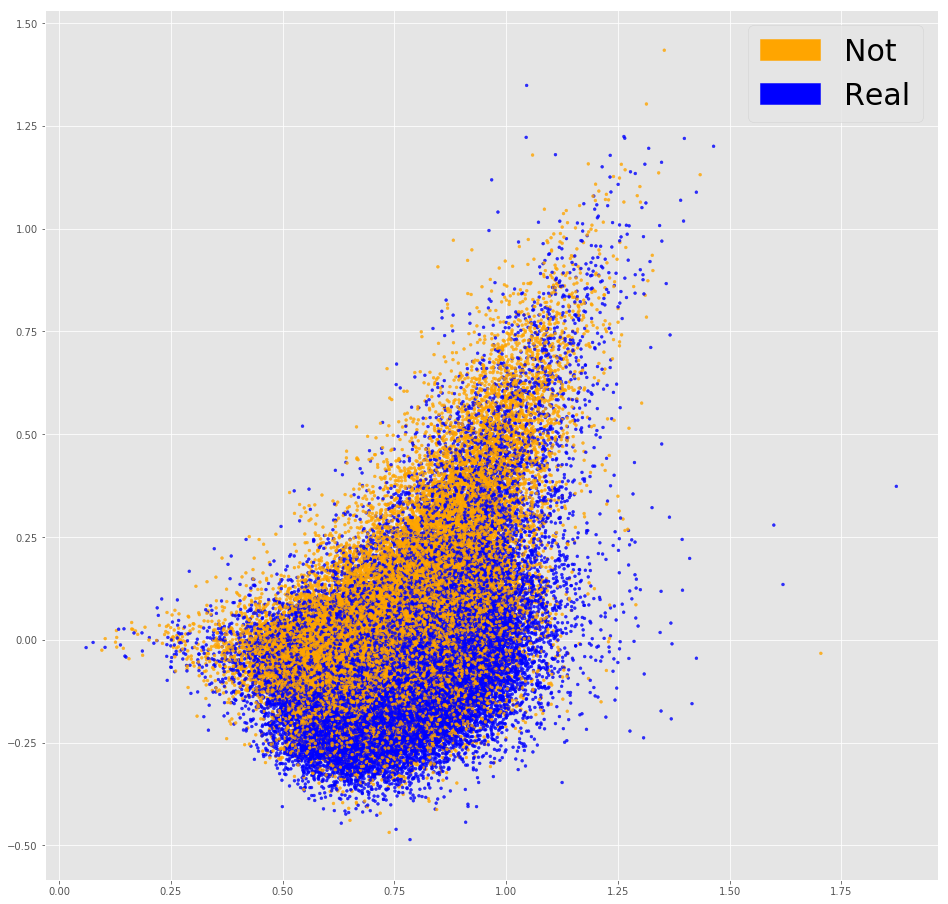

In [157]:
fig = plt.figure(figsize=(16, 16))   
plot_lsa(embeddings, list_labels)
plt.show()

In [158]:
from sklearn.linear_model import LogisticRegression

clf_w2v = LogisticRegression(C=30.0, solver='newton-cg',random_state=40)
clf_w2v.fit(X_train_word2vec, y_train_word2vec)
y_predicted_word2vec = clf_w2v.predict(X_test_word2vec)

LogisticRegression(C=30.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=40, solver='newton-cg', tol=0.0001, verbose=0,
                   warm_start=False)

In [159]:
accuracy, precision, recall, f1 = get_metrics(y_test, y_predicted_word2vec)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy, precision, recall, f1))

accuracy = 0.741, precision = 0.742, recall = 0.741, f1 = 0.740


### CNN Based classifier

In [28]:
from nltk.tokenize import RegexpTokenizer
def remove_html(text):
    """
    :return: self
    """

    # Remove html
    return BeautifulSoup(text, "lxml").text
retokenizer = RegexpTokenizer(r'\w+')
#df["Body"] = df["Body"].apply(lambda x: remove_html(x))
#df["tokens"] = df["body_clean"].apply(retokenizer.tokenize)

In [32]:
import gensim

word2vec_path = "GoogleNews-vectors-negative300.bin.gz"
word2vec = gensim.models.KeyedVectors.load_word2vec_format(word2vec_path, binary=True)

In [84]:
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

In [85]:
EMBEDDING_DIM = 300
MAX_SEQUENCE_LENGTH = 400
VOCAB_SIZE = len([word for tokens in df["tokens"] for word in tokens])

VALIDATION_SPLIT=.2
tokenizer = Tokenizer(num_words=VOCAB_SIZE)
tokenizer.fit_on_texts(df["body_clean"].tolist())
sequences = tokenizer.texts_to_sequences(df["body_clean"].tolist())

word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))

cnn_data = pad_sequences(sequences, maxlen=MAX_SEQUENCE_LENGTH)
labels = to_categorical(np.asarray(df["label"]))

indices = np.arange(cnn_data.shape[0])
np.random.shuffle(indices)
cnn_data = cnn_data[indices]
labels = labels[indices]
num_validation_samples = int(VALIDATION_SPLIT * cnn_data.shape[0])

embedding_weights = np.zeros((len(word_index)+1, EMBEDDING_DIM))
for word,index in word_index.items():
    embedding_weights[index,:] = word2vec[word] if word in word2vec else np.random.rand(EMBEDDING_DIM)
print(embedding_weights.shape)

Found 326357 unique tokens.
(326358, 300)


In [65]:
from tensorflow.keras.layers import Dense, Input, Flatten, Dropout, Concatenate
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Embedding
from tensorflow.keras.layers import LSTM, Bidirectional
from tensorflow.keras.models import Model
import tensorflow as tf

def ConvNet(embeddings, max_sequence_length, num_words, embedding_dim, labels_index, trainable=False, extra_conv=True):
    
    embedding_layer = Embedding(num_words,
                            embedding_dim,
                            weights=[embeddings],
                            input_length=max_sequence_length,
                            trainable=trainable)

    sequence_input = Input(shape=(max_sequence_length,), dtype='int32')
    embedded_sequences = embedding_layer(sequence_input)

    conv = Conv1D(filters=128, kernel_size=3, activation='relu')(embedded_sequences)
    pool = MaxPooling1D(pool_size=3)(conv)

    x = Dropout(0.5)(pool)
    x = Flatten()(x)
    x = Dense(128, activation='relu')(x)
    preds = Dense(labels_index, activation='softmax')(x)

    model = Model(sequence_input, preds)
    model.compile(loss='categorical_crossentropy',
                  optimizer='adam',
                  metrics=['acc'])

    return model

In [87]:
x_train = cnn_data[:-num_validation_samples]
y_train = labels[:-num_validation_samples]
x_val = cnn_data[-num_validation_samples:]
y_val = labels[-num_validation_samples:]



In [88]:
model = ConvNet(embedding_weights, MAX_SEQUENCE_LENGTH, len(word_index)+1, EMBEDDING_DIM, 
                len(list(df["label"].unique())), False)

In [66]:
model.fit(x_train, y_train, validation_data=(x_val, y_val), epochs=3, batch_size=128)


Train on 80000 samples, validate on 20000 samples
Epoch 1/3
80000/80000 [==============================] - 274s 3ms/sample - loss: 0.4196 - acc: 0.8005 - val_loss: 0.4559 - val_acc: 0.7833
Epoch 2/3
80000/80000 [==============================] - 274s 3ms/sample - loss: 0.3902 - acc: 0.8182 - val_loss: 0.4708 - val_acc: 0.7813
Epoch 3/3
80000/80000 [==============================] - 274s 3ms/sample - loss: 0.3595 - acc: 0.8347 - val_loss: 0.4719 - val_acc: 0.7812


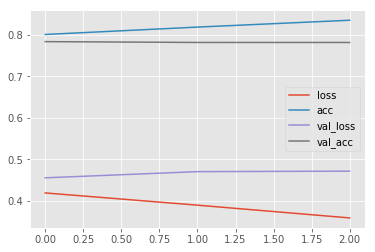

In [68]:
pd.DataFrame(model.history.history).plot()

#### The validation and train loss are starting to diverge I think this is the best performance for this model. 
#### 78% is our best yet

### Trying the dense feature based models

In [70]:
from scipy.sparse import csr_matrix
from scipy.sparse import hstack

In [92]:
X_train, X_test, y_train, y_test = train_test_split(df, df['label'], test_size=0.2, 
                                                                                random_state=40)

In [93]:
X_dense_train= X_train[['title_len','question_len', 'num_words', 'nums_code_block','len_code_block', 'num_url', 'num_so_url']]
X_dense_test= X_test[['title_len','question_len', 'num_words', 'nums_code_block','len_code_block', 'num_url', 'num_so_url']]

In [94]:
from sklearn.ensemble import AdaBoostClassifier

model = AdaBoostClassifier(random_state=1)
model.fit(X_dense_train, y_train)
model.score(X_dense_test,y_test)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=1)

0.72605

#### We see that the dense features also have good predictive power, lets combine them with tf-idf features to see if we get a bump in performance

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
def tfidf(data):
    tfidf_vectorizer = TfidfVectorizer(ngram_range=(1, 3), min_df = 10,max_features=1000)

    train = tfidf_vectorizer.fit_transform(data)

    return train, tfidf_vectorizer

X_train_tfidf_body, tfidf_vectorizer = tfidf(X_train['body_clean'])
X_test_tfidf_body = tfidf_vectorizer.transform(X_test['body_clean'])
X_train_tfidf_title, tfidf_vectorizer = tfidf(X_train['title_clean'])
X_test_tfidf_title = tfidf_vectorizer.transform(X_test['title_clean'])

In [74]:
df['title_len'] = df['Title'].apply(lambda x : len(x))

In [75]:
X_dense_train= X_train[['title_len','question_len', 'num_words', 'nums_code_block','len_code_block', 'num_url', 'num_so_url']]

In [76]:
X_dense_test= X_test[['title_len','question_len', 'num_words', 'nums_code_block','len_code_block', 'num_url', 'num_so_url']]

In [77]:
X_full = csr_matrix(hstack([X_dense_train, X_train_tfidf_body,X_train_tfidf_title]))
X_test_full = csr_matrix(hstack([X_dense_test, X_test_tfidf_body,X_test_tfidf_title]))

In [78]:
from sklearn.ensemble import AdaBoostClassifier

model = AdaBoostClassifier(random_state=1)
model.fit(X_full, y_train)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=1)

0.7674

In [80]:
y_pred = model.predict(X_test_full)

In [160]:
accuracy, precision, recall, f1 = get_metrics(y_test, y_pred)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy, precision, recall, f1))

accuracy = 0.767, precision = 0.767, recall = 0.767, f1 = 0.767


#### I am going to use a combination of tf-idf and numerica features to train my final model.


References:
    
1. https://arxiv.org/abs/1408.5882 -- 1D CNN insights and code
2. https://www.analyticsvidhya.com/blog/2018/06/comprehensive-guide-for-ensemble-models/ - Insights into ensemble models